In [183]:
import os
import xarray as xr
import numpy as np

%matplotlib inline

path='/opt/uio/GEO4962/outputs/runs/f2000.T31T31.control/atm/hist/'
experiment= 'f2000.T31T31.control'
month = 1
filenames = []
for year in range(1,3,1):
    for month in range(1,13,1):
        filenames.append(path+ experiment +'.cam.h0.' + "%04d" % year + '-' + "%02d" % month + '.nc')

dset = xr.open_mfdataset(filenames, decode_cf=False)
dset

<xarray.Dataset>
Dimensions:        (chars: 8, ilev: 31, lat: 48, lev: 30, lon: 96, nbnd: 2, time: 24)
Coordinates:
  * lev            (lev) float64 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * ilev           (ilev) float64 2.255 5.032 10.16 18.56 ... 967.5 985.1 1e+03
  * lat            (lat) float64 -87.16 -83.48 -79.78 ... 79.78 83.48 87.16
  * lon            (lon) float64 0.0 3.75 7.5 11.25 ... 345.0 348.8 352.5 356.2
  * time           (time) float64 31.0 59.0 90.0 120.0 ... 669.0 699.0 730.0
Dimensions without coordinates: chars, nbnd
Data variables:
    hyam           (time, lev) float64 dask.array<shape=(24, 30), chunksize=(1, 30)>
    hybm           (time, lev) float64 dask.array<shape=(24, 30), chunksize=(1, 30)>
    hyai           (time, ilev) float64 dask.array<shape=(24, 31), chunksize=(1, 31)>
    hybi           (time, ilev) float64 dask.array<shape=(24, 31), chunksize=(1, 31)>
    P0             (time) float64 1e+05 1e+05 1e+05 1e+05 ... 1e+05 1e+05 1e+05
    date  

In [184]:
var = dset['TS'][0,:,:]
#.isel(lev=31)
lat = dset['lat']
lon = dset['lon']
print(var.min())
print(var.max())
var

<xarray.DataArray 'TS' ()>
dask.array<shape=(), dtype=float32, chunksize=()>
Coordinates:
    time     float64 31.0
<xarray.DataArray 'TS' ()>
dask.array<shape=(), dtype=float32, chunksize=()>
Coordinates:
    time     float64 31.0


<xarray.DataArray 'TS' (lat: 48, lon: 96)>
dask.array<shape=(48, 96), dtype=float32, chunksize=(48, 96)>
Coordinates:
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
    time     float64 31.0
Attributes:
    units:         K
    long_name:     Surface temperature (radiative)
    cell_methods:  time: mean

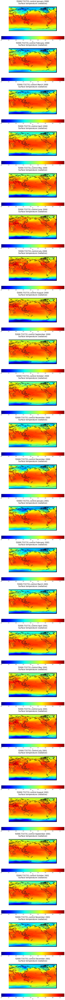

In [195]:
import matplotlib
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from mpl_toolkits.basemap import Basemap
import geojsoncontour
import geojson
import datetime

cmap = matplotlib.cm.get_cmap('jet')
nmonths=12
nyears=2
fig = plt.figure(figsize=(15,10*(nmonths*nyears)))


list_geojson=[]

idx=0
for year in range(1,nyears+1,1):
    for month in range(1,nmonths+1):
        var = dset['TS'][idx,:,:]
        ax = fig.add_subplot(nmonths*nyears, 1, idx+1)
        smonth = datetime.date(1999+year, month, 1).strftime('%B %Y')
        ax.set_title(experiment + ' ' + smonth +'\n' + var.long_name + '\n', fontsize=24)

        map = Basemap(lon_0=180.,  resolution='l')
        map.drawcoastlines()
        map.drawmapboundary(fill_color='black',zorder=0)

        x,y = np.meshgrid(lon.values,lat.values)
        xx,yy = map(x,y)
        vmin=200
        vmax=320
        levels=np.arange(vmin,vmax+1,2)
        cont=map.contourf(xx,yy,var, levels=levels, cmap=cmap, vmin=200, vmax=320)
        cbar=plt.colorbar(orientation='horizontal')
        cbar.set_label(label=var.units, size=15)
    
    # Convert matplotlib contourf to geojson
        sgeojson = geojsoncontour.contourf_to_geojson(
            contourf=cont,
            min_angle_deg=3.0,
            ndigits=5,
            stroke_width=1,
            fill_opacity=0.9)
        loaded = geojson.loads(sgeojson)

        for feature in loaded.features:
            dates =  "%04d" % (1999+year) + '-' +"%02d" % month + '-01T00:00:00'
            feature['geometry']['dates']= [dates, dates]
            feature['properties']['times'] = [dates, dates]
            feature['properties']['style']  = {
                'color':     feature['properties']['stroke'],
                'weight':    feature['properties']['stroke-width'],
                'fillColor': feature['properties']['fill'],
                'opacity':   0.6}
        list_geojson.append(loaded)
        idx=idx+1

In [196]:
fig.savefig('s.png')

In [197]:
import json
geo_str = json.dumps(list_geojson) 

In [198]:
import numpy as np
import folium
import branca
from folium import plugins
 
# Set up the folium plot
geomap = folium.Map([45., 180.], zoom_start=2, tiles="cartodbpositron")


In [199]:
 # Plot the contour plot on folium

plugins.TimestampedGeoJson(geo_str, period='P1M', add_last_point=True, duration='P1M').add_to(geomap)

# Add the colormap to the folium map
# Setup colormap
colors = [cmap(value) for value in range(cmap.N)]
cm     = branca.colormap.LinearColormap(colors, vmin=vmin, vmax=vmax).to_step(cmap.N)
cm.caption = 'Temperature (K)'
geomap.add_child(cm)
# Fullscreen mode
plugins.Fullscreen(position='topright', force_separate_button=True).add_to(geomap)
 
# Plot the data
geomap

In [200]:
geomap.save(f'folium_contour_temperature_map_CESM_control.html')